# Import

In [1]:
%load_ext autoreload
%autoreload 2
import os

import scanpy as sc

import matplotlib.pyplot as plt
import time
import numpy as np
import torch
import pandas as pd

from inVAE import FinVAE
#Or:
# import sys
# sys.path.append('../')
# from src.inVAE.model import FinVAE


sc.set_figure_params(dpi=200,figsize=(6,4),fontsize=10,frameon=False)

# Load Data

In [2]:
data_dir = './data/'

In [8]:
adata = sc.read(data_dir+'adata.h5ad')

In [9]:
adata_train = adata[
    :,
    adata.var.highly_variable
].copy()

In [10]:
#add the raw counts to a separate layer to be read by the model  
del adata_train.raw
adata_train.layers['raw'] = adata.raw.to_adata()[adata.obs_names,adata.var.highly_variable].X

In [11]:
del adata

In [12]:
#Remove unknown cells and extend the ann_level_3 annotation 
adata_train = adata_train[~adata_train.obs['ann_level_3'].isin(['NA','None','Unknown'])]
adata_train = adata_train[adata_train.obs['ann_finest_level']!='Unknown']

adata_train.obs['ann_level_3_ext'] = adata_train.obs['ann_level_3']
adata_train.obs['ann_level_3_ext'] = adata_train.obs['ann_level_3_ext'].astype(str)
for obs in adata_train[adata_train.obs['ann_level_3_ext']=='Basal'].obs_names:
    adata_train.obs.loc[obs,'ann_level_3_ext'] = adata_train.obs.loc[obs,'ann_finest_level']
for obs in adata_train[adata_train.obs['ann_level_3_ext']=='Fibroblasts'].obs_names:
    adata_train.obs.loc[obs,'ann_level_3_ext'] = adata_train.obs.loc[obs,'ann_finest_level']

/tmp/ipykernel_8103/1865472493.py:5: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_train.obs['ann_level_3_ext'] = adata_train.obs['ann_level_3']


In [125]:
adata_train.write(data_dir+'adata_processed.h5ad')

# Train inVAE 

In [3]:
adata_train = sc.read(data_dir+'adata_processed.h5ad')

In [4]:
# Empty cache 
import torch.cuda as tc
tc.empty_cache()

In [5]:
# Define covariates for the invariant and spurious prior in the following way/structure
# cat = categorical, cont = continuous

# Covariates for the invariant prior
inv_covar_keys = {
    'cont': [],
    'cat': [ 'disease','ann_level_3_ext']
}

# Covariates for the spurious prior
spur_covar_keys = {
    'cont': [],
    'cat': ['study']
}

In [6]:
# set the seeds for reproducibility
torch.manual_seed(100)
torch.cuda.manual_seed(100)
np.random.seed(100)

# train Factorized inVAE: FinVAE
model = FinVAE(
   adata = adata_train,
   layer = 'raw',
   batch_key = 'study',
   label_key = 'ann_level_3',
   inv_covar_keys = inv_covar_keys,
   spur_covar_keys = spur_covar_keys,
   latent_dim = 30, 
   latent_dim_spur = 10,
   n_layers = 2, 
   hidden_dim = 128,
   activation = 'relu', 
   slope = 0.1, # only needed when activation is Leaky ReLU ('lrelu')
   device = 'cuda', # or 'cpu' if no gpu is available
   normalize_constant = 1.0, 
   fix_mean_prior = True,
   fix_var_prior = False,
   decoder_dist = 'nb',
   batch_norm = True,
   kl_rate = 1.5,
   batch_size = 128,
   elbo_version = 'sample',
)

Data loading done!


In [17]:
model.train(
    n_epochs=300, 
    lr_train = 0.001, 
    weight_decay = 0.0006,
    log_dir = './test_invae/nf_invae',
    log_freq = 50, # in iterations
    print_every_n_epochs = 10
)

Starting training of model:
	epoch 10/300 took 6.7s; loss: 1098.38
	epoch 20/300 took 6.7s; loss: 1092.13
	epoch 30/300 took 6.68s; loss: 1089.59
	epoch 40/300 took 6.69s; loss: 1088.06
	epoch 50/300 took 6.7s; loss: 1086.76
	epoch 60/300 took 6.69s; loss: 1085.88
	epoch 70/300 took 6.7s; loss: 1085.35
	epoch 80/300 took 6.69s; loss: 1084.70
	epoch 90/300 took 6.7s; loss: 1084.49
	epoch 100/300 took 6.69s; loss: 1084.15
	epoch 110/300 took 6.7s; loss: 1083.81
	epoch 120/300 took 6.7s; loss: 1083.54
	epoch 130/300 took 6.7s; loss: 1083.31
	epoch 140/300 took 6.68s; loss: 1083.07
	epoch 150/300 took 6.7s; loss: 1082.89
	epoch 160/300 took 6.7s; loss: 1082.71
	epoch 170/300 took 6.7s; loss: 1082.59
	epoch 180/300 took 6.7s; loss: 1082.53
	epoch 190/300 took 6.69s; loss: 1082.40
	epoch 200/300 took 6.7s; loss: 1082.39
	epoch 210/300 took 6.69s; loss: 1082.16
	epoch 220/300 took 6.69s; loss: 1082.01
	epoch 230/300 took 6.69s; loss: 1082.09
	epoch 240/300 took 6.69s; loss: 1081.96
	epoch 250

In [139]:
model.save('./model_inVAE.pt')

Saving the pytorch module...
To load the model later you need to save the hyperparameters in a separate file/dictionary.


# Data represenation

In [3]:
model.load('./model_inVAE.pt') 

## Invariant data representation

In [19]:
latent = model.get_latent_representation(latent_type='inv')

Using saved adata for latent representation!


In [20]:
adata_train.obsm['X_FinVAE'] = latent

sc.pp.neighbors(adata_train, use_rep='X_FinVAE')
sc.tl.umap(adata_train)

/nfs/team292/ha10/miniconda3/envs/data-an/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/nfs/team292/ha10/miniconda3/envs/data-an/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/nfs/team292/ha10/miniconda3/envs/data-an/lib/python3.9/si

/nfs/team292/ha10/miniconda3/envs/data-an/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


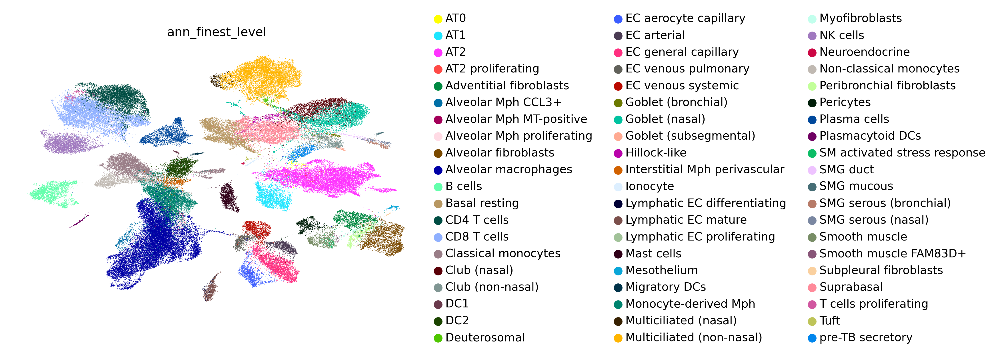

In [21]:
sc.pl.umap(adata_train,color='ann_finest_level')

/nfs/team292/ha10/miniconda3/envs/data-an/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


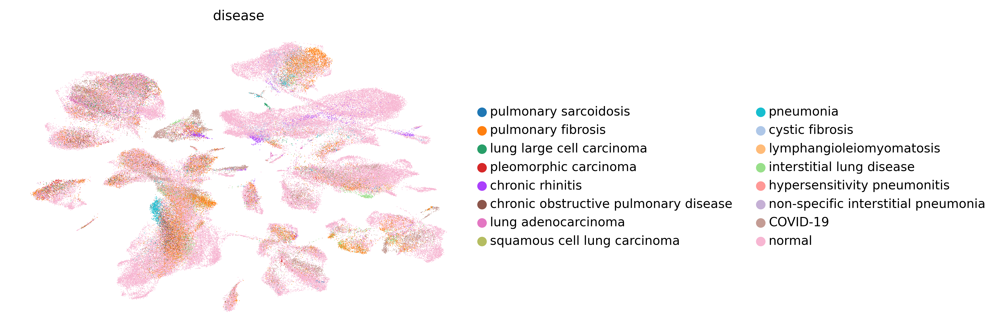

In [22]:
sc.pl.umap(adata_train,color='disease')

/nfs/team292/ha10/miniconda3/envs/data-an/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


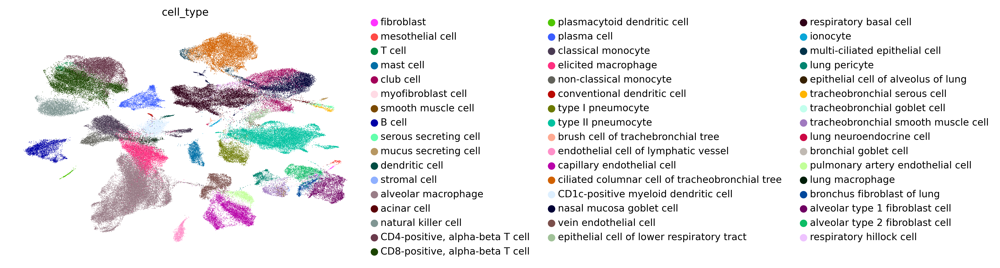

In [23]:
sc.pl.umap(adata_train,color='cell_type')

## Spurious data representation

In [26]:
spur_latent = model.get_latent_representation(latent_type='spur')

Using saved adata for latent representation!


In [27]:
adata_train.obsm['X_FinVAE_spur'] = spur_latent

sc.pp.neighbors(adata_train, use_rep='X_FinVAE_spur')
sc.tl.umap(adata_train)

/nfs/team292/ha10/miniconda3/envs/data-an/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


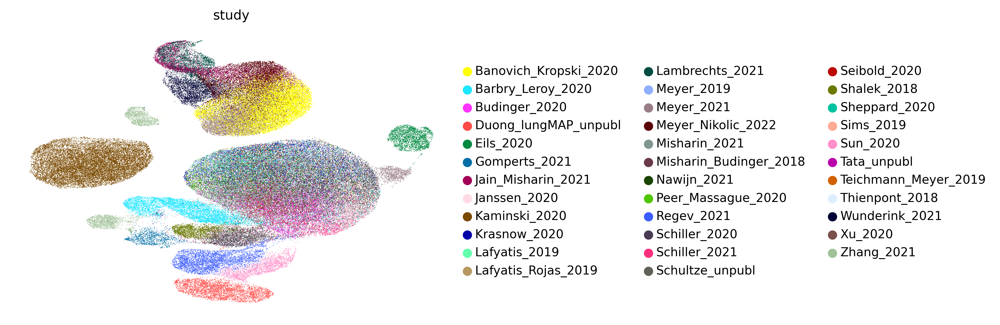

In [28]:
sc.pl.umap(adata_train,color='study')

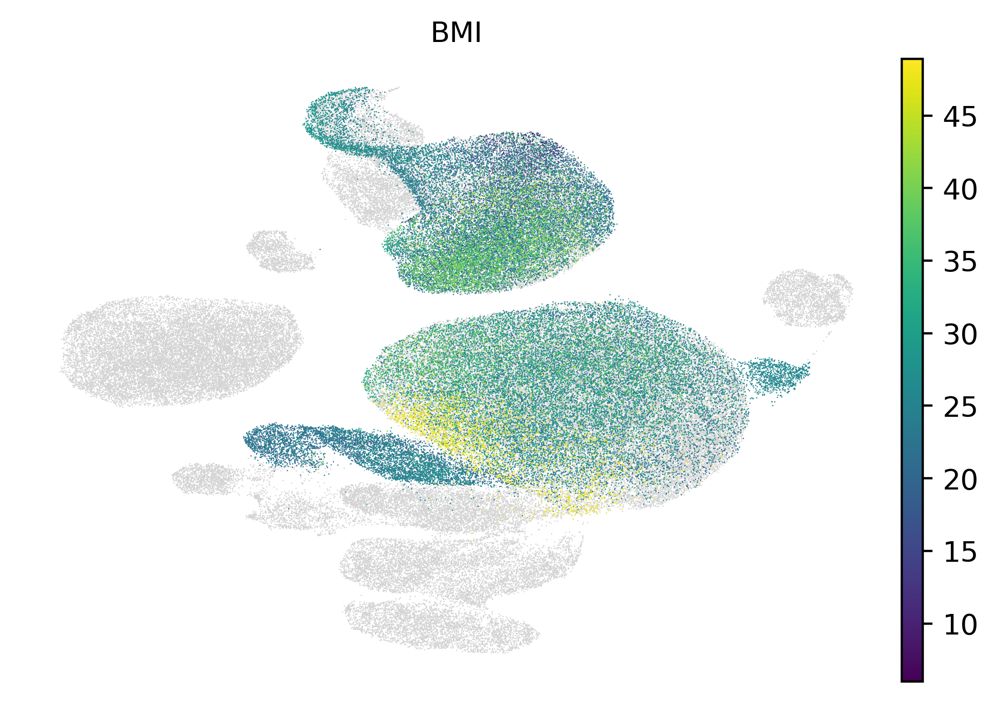

In [30]:
sc.pl.umap(adata_train,color='BMI')

/nfs/team292/ha10/miniconda3/envs/data-an/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/nfs/team292/ha10/miniconda3/envs/data-an/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


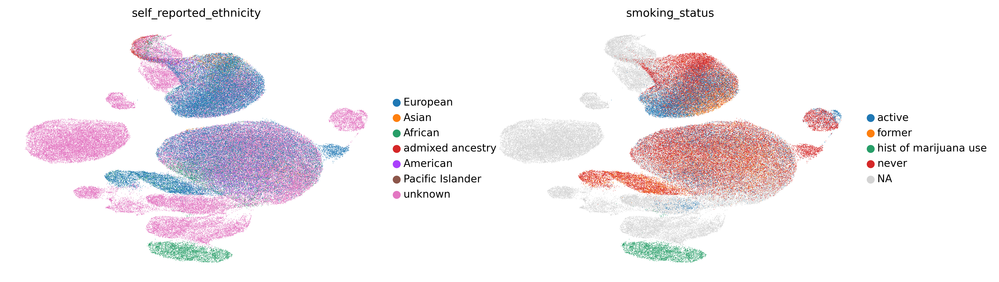

In [31]:
sc.pl.umap(adata_train,color=['self_reported_ethnicity','smoking_status'])